In [1]:
from transformers import RobertaModel, RobertaTokenizer
from bertviz import head_view, model_view
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw

In [2]:
%%javascript
require.config({
  paths: {
      d3: '//cdnjs.cloudflare.com/ajax/libs/d3/3.4.8/d3.min',
      jquery: '//ajax.googleapis.com/ajax/libs/jquery/2.0.0/jquery.min',
  }
});


<IPython.core.display.Javascript object>

In [3]:
def call_html():
    import IPython
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              "d3": "https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.8/d3.min",
              jquery: '//ajax.googleapis.com/ajax/libs/jquery/2.0.0/jquery.min',
            },
          });
        </script>
        '''))

In [4]:
# Hansen_d outliers exampl
sentence_a = "CN(C)CCOC(=O)COc1ccc(Cl)cc1"
sentence_b = "BrC(Br)C(Br)Br"
sentence_c = "CCCCCCCCCCCCCCCCCC(=O)OCCCC"

# hansen_h outliers example 
sentence_d = "CN[C@@H](C)[C@H](O)c1ccccc1"
sentence_e = "CC1=CN([C@@H]2O[C@H](CO)[C@@H](O)[C@H]2O)C(=O)NC1=O"
sentence_f = "C1CCCCCCCCCCC1"

# hansen_p outliers example 
sentence_g = "Sc1cc(Cl)c(Cl)cc1Cl"
sentence_h = "OCCOCCOCCO"
sentence_i = "c1ccnnc1"

In [5]:
model_version = 'seyonec/ChemBERTa-zinc-base-v1'
model_version_fold1 = f'C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold1/model'
model_version_fold2 = f'C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold2/model'
model_version_fold3 = f'C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold3/model'
model_version_fold4 = f'C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold4/model'
model_version_fold5 = f'C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold5/model'
model_version_fold6 = f'C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold6/model'

model_fold1 = RobertaModel.from_pretrained(model_version_fold1, output_attentions=True)
model_fold2 = RobertaModel.from_pretrained(model_version_fold2, output_attentions=True)
model_fold3 = RobertaModel.from_pretrained(model_version_fold3, output_attentions=True)
model_fold4 = RobertaModel.from_pretrained(model_version_fold4, output_attentions=True)
model_fold5 = RobertaModel.from_pretrained(model_version_fold5, output_attentions=True)
model_fold6 = RobertaModel.from_pretrained(model_version_fold6, output_attentions=True)

tokenizer = RobertaTokenizer.from_pretrained(model_version)

Some weights of the model checkpoint at C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold1/model were not used when initializing RobertaModel: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaModel were not initialized from the model checkpoint at C:/Users/pj11/Documents/bert_finetune/hansen_h_cross_val_fold1/model and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on

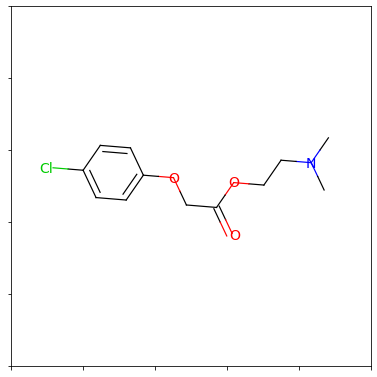

In [6]:
m = Chem.MolFromSmiles(sentence_a)
fig = Draw.MolToMPL(m, size=(200, 200))

In [7]:
# fold4
inputs = tokenizer.encode(sentence_a, return_tensors='pt', add_special_tokens=True)
outputs = model_fold4(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [8]:
inputs = tokenizer.encode(sentence_a, return_tensors='pt')
outputs = model_fold4(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

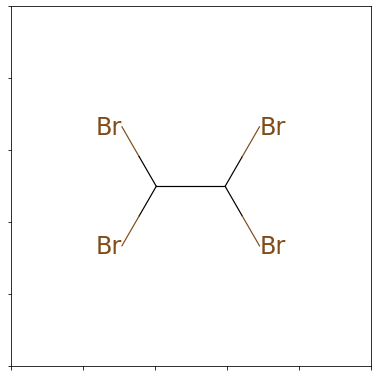

In [9]:
m = Chem.MolFromSmiles(sentence_b)
fig = Draw.MolToMPL(m, size=(200, 200))

In [10]:
# fold1
inputs = tokenizer.encode(sentence_b, return_tensors='pt', add_special_tokens=True)
outputs = model_fold1(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [11]:
inputs = tokenizer.encode(sentence_b, return_tensors='pt')
outputs = model_fold1(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

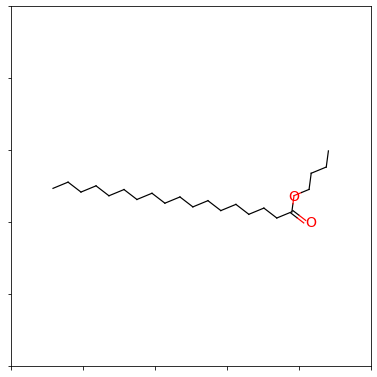

In [12]:
m = Chem.MolFromSmiles(sentence_c)
fig = Draw.MolToMPL(m, size=(200, 200))

In [13]:
# fold4
inputs = tokenizer.encode(sentence_c, return_tensors='pt', add_special_tokens=True)
outputs = model_fold4(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [14]:
inputs = tokenizer.encode(sentence_c, return_tensors='pt')
outputs = model_fold4(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

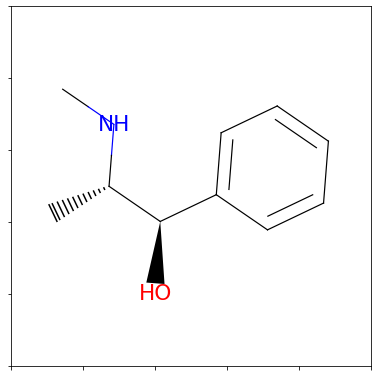

In [15]:
m = Chem.MolFromSmiles(sentence_d)
fig = Draw.MolToMPL(m, size=(200, 200))

In [16]:
# fold2
inputs = tokenizer.encode(sentence_d, return_tensors='pt', add_special_tokens=True)
outputs = model_fold2(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [17]:
inputs = tokenizer.encode(sentence_d, return_tensors='pt')
outputs = model_fold2(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

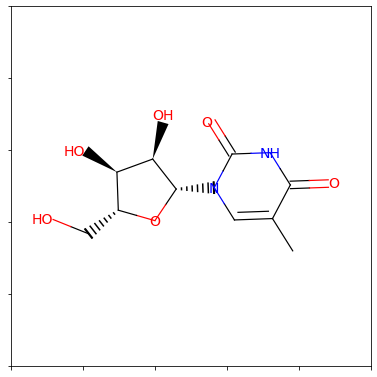

In [18]:
m = Chem.MolFromSmiles(sentence_e)
fig = Draw.MolToMPL(m, size=(200, 200))

In [19]:
# fold3
inputs = tokenizer.encode(sentence_e, return_tensors='pt', add_special_tokens=True)
outputs = model_fold3(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [20]:
inputs = tokenizer.encode(sentence_e, return_tensors='pt')
outputs = model_fold3(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

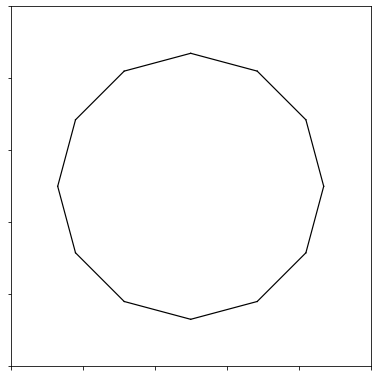

In [21]:
m = Chem.MolFromSmiles(sentence_f)
fig = Draw.MolToMPL(m, size=(200, 200))

In [22]:
# fold6
inputs = tokenizer.encode(sentence_f, return_tensors='pt', add_special_tokens=True)
outputs = model_fold6(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [23]:
inputs = tokenizer.encode(sentence_f, return_tensors='pt')
outputs = model_fold6(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

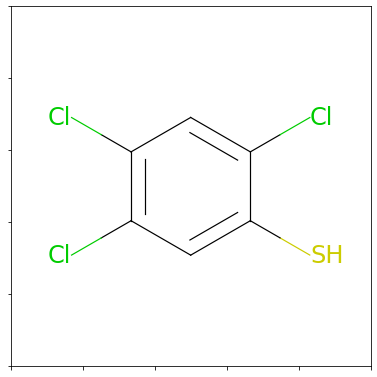

In [24]:
m = Chem.MolFromSmiles(sentence_g)
fig = Draw.MolToMPL(m, size=(200, 200))

In [25]:
# fold3
inputs = tokenizer.encode(sentence_g, return_tensors='pt', add_special_tokens=True)
outputs = model_fold3(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [26]:
inputs = tokenizer.encode(sentence_g, return_tensors='pt')
outputs = model_fold3(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

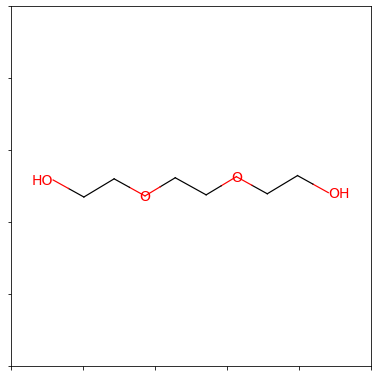

In [27]:
m = Chem.MolFromSmiles(sentence_h)
fig = Draw.MolToMPL(m, size=(200, 200))

In [28]:
# fold6
inputs = tokenizer.encode(sentence_h, return_tensors='pt', add_special_tokens=True)
outputs = model_fold6(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [29]:
inputs = tokenizer.encode(sentence_h, return_tensors='pt')
outputs = model_fold6(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>

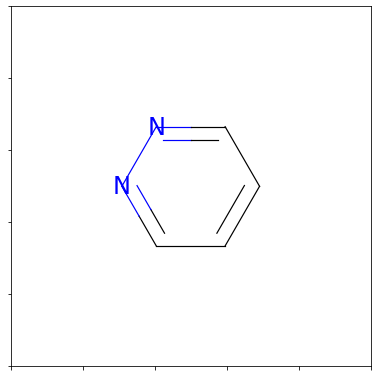

In [30]:
m = Chem.MolFromSmiles(sentence_i)
fig = Draw.MolToMPL(m, size=(200, 200))

In [31]:
# fold1
inputs = tokenizer.encode(sentence_i, return_tensors='pt', add_special_tokens=True)
outputs = model_fold1(inputs)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(inputs[0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [32]:
inputs = tokenizer.encode(sentence_i, return_tensors='pt')
outputs = model_fold1(inputs)
attention = outputs[-1]  # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(inputs[0]) 
model_view(attention, tokens)

<IPython.core.display.Javascript object>